### Click Through Rate Prediction 

#### Introduction

Click through rate (CTR) is the ratio of clicks on ad impressions. In digital advertising, CTR is very important metric to both advertisers (companies) and platform providers such as google or facebook, particularly if the ads are on the cost per click (CPC) model , because it affects the ad quality score, which inturn affects the pricing. Higher the CTR, higher the ad quality score and lower the cost per click. Therefore, platform providers have interest to accurately predict the CTR because it is a subject of opportunity cost. While, Aadvertisers have interest to optimize bidding cost, landing page, ad quality. Models based on the historical ad click data can be very useful to predict the CTR. However, there are many challenges for developing good models to predict CTR accurately. Some of those challenges are:
1. Class imbalance: the ratio of click and not click is very low. 
2. Customer beviour changes frequently, the model required to capture those changing behaviours
3. Data leakage issues: it is likely that the data used to train the model is not available during implementation. 
    

#### Objective

The objectives are as:
1. Perform exploratory data analysis
2. Clean dataset
3. Prepare dataset by feature engineering, trasforming and scaling    
4. Train and evaluate models 
5. Select best model and present to business stakeholders


#### About Dataset

The Kaggle has lauched the CTR prediction contest on 2014 and provided 11 days worth of mobile adclick data. The original dataset has one million records, but since it consumes lot of resources we used shortend version of this dataset, which has 50,000 records. The link to dataset is https://www.kaggle.com/datasets/gauravduttakiit/avazu-ctr-prediction-with-random-50k-rows 

#### Importing necessary libraries

In [1]:
import pandas as pd
import plotly.express as px
import datetime
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
import sklearn
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import MinMaxScaler
import category_encoders as ce
import scikitplot as skplt
import matplotlib


### Data

##### Reading Dataset 

In [2]:
df = pd.read_csv('D:/MSBA/Iv Sem/Capstone/avazu-ctr-prediction/50k_records.csv')
df.head()

,id,click,hour,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,...,device_type,device_conn_type,C14,C15,C16,C17,C18,C19,C20,C21
0,10048000000000000000,0,10/21/2014 0:00,1005,0,543a539e,c7ca3108,3e814130,ecad2386,7801e8d9,...,1,0,20366,320,50,2333,0,39,-1,157
1,10060100000000000000,0,10/21/2014 0:00,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,...,1,0,15701,320,50,1722,0,35,100084,79
2,10101600000000000000,0,10/21/2014 0:00,1010,1,85f751fd,c4e18dd6,50e219e0,ffc6ffd0,7801e8d9,...,4,0,21665,320,50,2493,3,35,-1,117
3,10242200000000000000,0,10/21/2014 0:00,1005,0,26fa1946,e2a5dc06,3e814130,ecad2386,7801e8d9,...,1,2,20366,320,50,2333,0,39,100103,157
4,10260700000000000000,0,10/21/2014 0:00,1005,0,85f751fd,c4e18dd6,50e219e0,0acbeaa3,45a51db4,...,1,0,20596,320,50,2161,0,35,-1,157


#### Dataset columns

In [3]:
df.columns

Index(['id', 'click', 'hour', 'C1', 'banner_pos', 'site_id', 'site_domain',
       'site_category', 'app_id', 'app_domain', 'app_category', 'device_id',
       'device_ip', 'device_model', 'device_type', 'device_conn_type', 'C14',
       'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21'],
      dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                50000 non-null  uint64
 1   click             50000 non-null  int64 
 2   hour              50000 non-null  object
 3   C1                50000 non-null  int64 
 4   banner_pos        50000 non-null  int64 
 5   site_id           50000 non-null  object
 6   site_domain       50000 non-null  object
 7   site_category     50000 non-null  object
 8   app_id            50000 non-null  object
 9   app_domain        50000 non-null  object
 10  app_category      50000 non-null  object
 11  device_id         50000 non-null  object
 12  device_ip         50000 non-null  object
 13  device_model      50000 non-null  object
 14  device_type       50000 non-null  int64 
 15  device_conn_type  50000 non-null  int64 
 16  C14               50000 non-null  int64 
 17  C15         

In [5]:
df.shape

(50000, 24)

##### About Dataset

1. Dataset contains 24 columns and 1048575 instances. 
2. The first column 'id' is categorical and is numeric datatype. 
3. Column 'click' is target variable and is integer datatype. 
4. Column 'hour' is is actualy a time and date, when the instances were recorded. 
5. Column 5-7 is about site featuers, 8-10 app features, 11-15 is about device features. 
6. Column c1 and c14 - c21 is categorical variables 


##### Examining the number of unique values of each variables

In [6]:
for i in df.columns:
    print (i,len(df[i].unique()), sep = ': ')

#len(df['device_type'].unique())


id: 46770
click: 2
hour: 240
C1: 7
banner_pos: 7
site_id: 1156
site_domain: 1008
site_category: 18
app_id: 977
app_domain: 68
app_category: 19
device_id: 8466
device_ip: 41432
device_model: 2530
device_type: 4
device_conn_type: 4
C14: 1517
C15: 8
C16: 9
C17: 385
C18: 4
C19: 63
C20: 152
C21: 60


In [7]:
df_dup = df[df.id.duplicated()]
df_dup.head(-30)

,id,click,hour,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,...,device_type,device_conn_type,C14,C15,C16,C17,C18,C19,C20,C21
582,14223200000000000000,0,10/21/2014 3:00,1005,0,85f751fd,c4e18dd6,50e219e0,fc46e1c5,2347f47a,...,1,0,12000,320,50,1248,2,39,-1,13
1201,15671600000000000000,0,10/21/2014 5:00,1005,1,e023ba3e,75f9ddc3,f028772b,ecad2386,7801e8d9,...,1,0,20312,320,50,1780,0,1711,100077,48
1218,16267300000000000000,1,10/21/2014 5:00,1005,0,5b08c53b,7687a86e,3e814130,ecad2386,7801e8d9,...,1,0,21277,300,250,2443,2,39,-1,23
1515,14837000000000000000,1,10/21/2014 6:00,1002,0,84c7ba46,c4e18dd6,50e219e0,ecad2386,7801e8d9,...,0,0,21689,320,50,2496,3,167,100191,23
1547,16757000000000000000,0,10/21/2014 6:00,1005,0,85f751fd,c4e18dd6,50e219e0,f0d41ff1,2347f47a,...,1,2,21666,320,50,2494,3,35,-1,112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49662,15052600000000000000,0,10/30/2014 21:00,1005,1,e151e245,7e091613,f028772b,ecad2386,7801e8d9,...,1,0,22813,320,50,2647,2,39,100148,23
49671,16111800000000000000,0,10/30/2014 21:00,1005,0,85f751fd,c4e18dd6,50e219e0,9c13b419,2347f47a,...,1,0,23723,320,50,2716,3,47,-1,23
49672,16118700000000000000,0,10/30/2014 21:00,1005,1,fe8cc448,9166c161,0569f928,ecad2386,7801e8d9,...,1,0,22173,320,50,2554,3,167,-1,23
49677,17124300000000000000,1,10/30/2014 21:00,1005,0,85f751fd,c4e18dd6,50e219e0,9c13b419,2347f47a,...,1,0,23161,320,50,2667,0,47,-1,221


comment:
     it appeared that 3230 ids are duplicated, so does this mean these are duplicated instances?
        
Check if these ids are duplicated instances!


##### Check if the duplicated ids are duplicated instances

In [8]:
df_dup = df[df.duplicated()]
print (df_dup)

Empty DataFrame
Columns: [id, click, hour, C1, banner_pos, site_id, site_domain, site_category, app_id, app_domain, app_category, device_id, device_ip, device_model, device_type, device_conn_type, C14, C15, C16, C17, C18, C19, C20, C21]
Index: []

[0 rows x 24 columns]


comment:
    1. there are no dupicate instances

##### drop id columns

In [9]:
df_1 = df.loc[:, ~df.columns.isin(['id'])]
df_1.head()

,click,hour,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,app_category,...,device_type,device_conn_type,C14,C15,C16,C17,C18,C19,C20,C21
0,0,10/21/2014 0:00,1005,0,543a539e,c7ca3108,3e814130,ecad2386,7801e8d9,07d7df22,...,1,0,20366,320,50,2333,0,39,-1,157
1,0,10/21/2014 0:00,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,07d7df22,...,1,0,15701,320,50,1722,0,35,100084,79
2,0,10/21/2014 0:00,1010,1,85f751fd,c4e18dd6,50e219e0,ffc6ffd0,7801e8d9,0f2161f8,...,4,0,21665,320,50,2493,3,35,-1,117
3,0,10/21/2014 0:00,1005,0,26fa1946,e2a5dc06,3e814130,ecad2386,7801e8d9,07d7df22,...,1,2,20366,320,50,2333,0,39,100103,157
4,0,10/21/2014 0:00,1005,0,85f751fd,c4e18dd6,50e219e0,0acbeaa3,45a51db4,f95efa07,...,1,0,20596,320,50,2161,0,35,-1,157


##### checking Click through rate

In [10]:
ctr = df_1.click.sum()/len(df)
print ('Click Through Rate of this dataset is: ', ctr)

Click Through Rate of this dataset is:  0.16934


#### Change values of the variables to make it more interesting and also for better EDA

In [11]:
# assign  mobile, pc, tables and other for device type 0,1 4,5 respectively


device_type_1 = list()
for i in df_1['device_type']:
    if i == 0:
        i = 'mobile'
        device_type_1.append(i)
        
    elif i == 1:
        i ='pc'
        device_type_1.append(i)
    elif i == 4:
            i = 'tablet'
            device_type_1.append(i)
    else:
            i == 5
            i = 'other'
            device_type_1.append(i)

df_1['device_type_1'] = device_type_1
            
        
 # assign  wifi, mobile_net, other, unknown for 0, 1, 3, 5 respectively
device_conn_type_1 =list()
for i in df_1['device_conn_type']:
    if i == 0:
        i = 'wifi'
        device_conn_type_1.append(i)
        
    elif i == 2:
        i ='mobile_net'
        device_conn_type_1.append(i)
    elif i == 3:
            i = 'others'
            device_conn_type_1.append(i)
    else:
            i == 5
            i = 'unknown'
            device_conn_type_1.append(i)

df_1['device_conn_type_1'] = device_conn_type_1

##### Drop columns

In [12]:
cols_to_drop = ['device_type', 'device_conn_type']

In [13]:
df_1.drop(columns = cols_to_drop, axis  =1)

,click,hour,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,app_category,...,C14,C15,C16,C17,C18,C19,C20,C21,device_type_1,device_conn_type_1
0,0,10/21/2014 0:00,1005,0,543a539e,c7ca3108,3e814130,ecad2386,7801e8d9,07d7df22,...,20366,320,50,2333,0,39,-1,157,pc,wifi
1,0,10/21/2014 0:00,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,07d7df22,...,15701,320,50,1722,0,35,100084,79,pc,wifi
2,0,10/21/2014 0:00,1010,1,85f751fd,c4e18dd6,50e219e0,ffc6ffd0,7801e8d9,0f2161f8,...,21665,320,50,2493,3,35,-1,117,tablet,wifi
3,0,10/21/2014 0:00,1005,0,26fa1946,e2a5dc06,3e814130,ecad2386,7801e8d9,07d7df22,...,20366,320,50,2333,0,39,100103,157,pc,mobile_net
4,0,10/21/2014 0:00,1005,0,85f751fd,c4e18dd6,50e219e0,0acbeaa3,45a51db4,f95efa07,...,20596,320,50,2161,0,35,-1,157,pc,wifi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0,10/30/2014 23:00,1005,0,85f751fd,c4e18dd6,50e219e0,685d1c4c,2347f47a,8ded1f7a,...,23222,320,50,2676,0,299,100176,221,pc,others
49996,0,10/30/2014 23:00,1005,1,e151e245,7e091613,f028772b,ecad2386,7801e8d9,07d7df22,...,22814,320,50,2647,2,39,100148,23,pc,mobile_net
49997,0,10/30/2014 23:00,1005,0,85f751fd,c4e18dd6,50e219e0,febd1138,82e27996,0f2161f8,...,21611,320,50,2480,3,299,100111,61,pc,wifi
49998,0,10/30/2014 23:00,1005,0,85f751fd,c4e18dd6,50e219e0,685d1c4c,2347f47a,8ded1f7a,...,24008,320,50,2749,0,43,100176,221,pc,mobile_net


## Exploratory Data Analysis 


lets do some basic exploratory data analysis!
The column 'hour' is object data type, so we will change this to the date type and extract, month and days name and hour to see the distribution of clicks in this by month, days, and hour

##### Examine the distribution of the values of categorical variables type. 

In [14]:
categorical_cols = df_1.select_dtypes(include = ['object']).columns.tolist()

In [15]:
print (categorical_cols)

['hour', 'site_id', 'site_domain', 'site_category', 'app_id', 'app_domain', 'app_category', 'device_id', 'device_ip', 'device_model', 'device_type_1', 'device_conn_type_1']


In [16]:
for col in categorical_cols:
    df_dist = df_1[col].value_counts()
    fig = px.bar(data_frame = df_dist, title = f'Distribution by {col}')
    #fig.update_layout(xaxis = dict(tickmode = 'linear'))
    fig.show()

In [17]:
dist_click = df_1['click'].value_counts(normalize= True)
dist_1 = px.bar(data_frame = dist_click, title = f'Distribution by click', 
               labels = {'value': 'Click/ Not-click Rate', 'index': 'click / not-click'})
dist_1.update_layout(width=400, height=400, bargap=0.2, xaxis = dict(tickmode = 'linear'))
dist_1.update_traces(marker_color='rgb(12,120,204)')
dist_1.update_yaxes(tickformat=".0%")
dist_1.show()

In [18]:
# c20_dist = df_1['C20'].value_counts()
# c20_dist_fig = px.bar(data_frame = c20_dist)
# c20_dist_fig.show()

##### Examine the distribution of values by numerical columns

In [19]:
numerical_cols = df_1.select_dtypes(include = ['int']).columns.tolist()
numerical_cols

['click',
 'C1',
 'banner_pos',
 'device_type',
 'device_conn_type',
 'C14',
 'C15',
 'C16',
 'C17',
 'C18',
 'C19',
 'C20',
 'C21']

In [20]:
for col in numerical_cols:
    df_dist = df_1[col].value_counts()
    fig = px.bar(data_frame = df_dist, title = f'Distribution by {col}')
    #fig.update_layout(xaxis = dict(tickmode = 'linear'))
    fig.show()

Observations:
1. CRT is about 17 percent, the class is slightly imbalance.
2. Ad impressions shown over the course of 10 days were almost constant. But on oct 22 (Tue) and oct 28 (wed), more ad impression were shown. 
3. C1  category has value on 7 different categoreis, however only category type 1003, 1005, 1010 and 1013 has significant numbers. 
4. Only banner position type 0 and 1 has significant numbers. Banner position 2 to 7 has very minimum values. 
5. site_id has over 1000 different values, however only few values has significant numbers. 
6. side_domain has over 1000 different values, however only few values has significant numbers. 
7. Four types of site_category have most value. (values are mostly concentrated in four site_category)
8. Only few app ids have significant numbers. 
9. Only about 10 app_domain has significant numbers
10.Two app categories types making the 90 percent of the numbers. There are only about 10 types of apps that has significant numbers. 
11. device_id has above 8000 categories and all categories have low and equal distribution. Hence, this variable will not contribute any in the analysis, we therefore drop this variable.
11. device_ip has above 8000 categories and all categories have low and equal distribution. Hence, this variable will not contribute any in the analysis, we therefore drop this variable.
12. Only about 10 device_model type has significant numbers.
13. Device type 1 has alomost 90 percent values.
13. Device_conn_type o has almost 90 percent of the values.
14. Variable C14 has many categories, many has significant numbers. 
15. Variable C15 has 8 categories, of which only category 216, 200 and 320 has significant numbers. 
16. Variable C16 has 9 categories but only categories has significant numbers.
17. Variable C17 has many categories, many has significant numbers. 
18. Variable C19 has many categories, many has significant numbers. 
19. Variable C21 has many categories, many has significant numbers. 

#### Analysis of CTR by time features

In [21]:
import datetime 

In [22]:
df_1['hour'] = pd.to_datetime(df_1['hour'])


In [23]:
#df_1['hour']

In [24]:

df_1['day_name'] = df_1['hour'].dt.day_name()

df_1['time'] = df_1['hour'].dt.hour

In [25]:
df_1.head()

,click,hour,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,app_category,...,C16,C17,C18,C19,C20,C21,device_type_1,device_conn_type_1,day_name,time
0,0,2014-10-21,1005,0,543a539e,c7ca3108,3e814130,ecad2386,7801e8d9,07d7df22,...,50,2333,0,39,-1,157,pc,wifi,Tuesday,0
1,0,2014-10-21,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,07d7df22,...,50,1722,0,35,100084,79,pc,wifi,Tuesday,0
2,0,2014-10-21,1010,1,85f751fd,c4e18dd6,50e219e0,ffc6ffd0,7801e8d9,0f2161f8,...,50,2493,3,35,-1,117,tablet,wifi,Tuesday,0
3,0,2014-10-21,1005,0,26fa1946,e2a5dc06,3e814130,ecad2386,7801e8d9,07d7df22,...,50,2333,0,39,100103,157,pc,mobile_net,Tuesday,0
4,0,2014-10-21,1005,0,85f751fd,c4e18dd6,50e219e0,0acbeaa3,45a51db4,f95efa07,...,50,2161,0,35,-1,157,pc,wifi,Tuesday,0


##### Hourly impressions 

In [26]:
px.line(data_frame = df_1.groupby('hour').agg({'click':'count'}), 
                       title = 'Total hourly Impressions ', 
                        labels={'value':'total number of impressions',
                               'hour': 'hour and day',
                               'variable': 'impressions'})




Comment:
During middays of October 22 adn 28, the impression shown were highest. And early morning of October 25, the lowest number of impressions were showm. Besides that fairly equal number of impressions were shown on other days and time. 

##### CTR by hour 

In [27]:
by_hour = df_1.groupby('time')['click'].agg('mean').reset_index().sort_values(by= 'click', ascending = False)


In [28]:
click_byhour =px.bar(data_frame = by_hour,
                     x = 'time',
                    
                    y = 'click',
                    title = 'click rates by hour', 
                    labels = {'time': 'hour'})
click_byhour.update_traces(marker_color='rgb(12,120,204)')
click_byhour.update_layout(width=1000, height=400, bargap=0.4, xaxis = dict(tickmode = 'linear', categoryorder ='category descending'))
click_byhour.update_yaxes(tickformat=".0%")


##### Comparisons of Clicks vs Non Clicks by days 

In [29]:
click_unclick_day  = df_1.groupby(['day_name', 'click']).size().unstack()
click_unclick_day.rename(columns = {0:'unclick', 1:'click'})
color_map = {'0':'rgb(192,192,192)', '1':'rgb(12,120,204)'}
click_unclick_day_bar = px.bar(data_frame = click_unclick_day,
                               labels = {'value': 'Number of Clicks/Non-Clicks',
                                        'day_name':'days'},
                               barmode = 'group', 
                               color_discrete_map = color_map, 
                               title  = 'click vs not click by day')

click_unclick_day_bar.update_layout(width=700, height=400, bargap=0.2, xaxis = dict(tickmode = 'linear', categoryorder ='category descending'))
click_unclick_day_bar.show()

In [30]:
click_rate_day = df_1.groupby('day_name')['click'].agg('mean').reset_index().sort_values(by = 'click', ascending  = False)
click_rate_day 

,day_name,click
2,Saturday,0.187349
1,Monday,0.184864
3,Sunday,0.183030
4,Thursday,0.173720
0,Friday,0.172192
5,Tuesday,0.163963
6,Wednesday,0.152554


In [31]:
click_rate_day_bar = px.bar(data_frame = click_rate_day, 
                           title = 'click through rate by day', 
                            labels = {'day_name':'days',
                                     'click':'CTR'},
                            
                           x = 'day_name', 
                           y = 'click')
click_rate_day_bar.update_layout(width = 500, height = 400, bargap=0.2, xaxis = dict(tickmode = 'linear'))
click_rate_day_bar.update_traces(marker_color='rgb(12,120,204)')
click_rate_day_bar.update_yaxes(tickformat=".0%")


#### Insights on CTR by analysing time and days

1. Midnights and mid-days' click though rates are high. 
2. Saturdays, sundays and mondays, click through rates are high. 
3. Wednesday, Tuesday and Thursday are the days more ad impressions are shown.
    

#### Analysis of CTR by single categorical feature

In [32]:
#Relative analysis 

columns = ['device_type_1', 'device_conn_type_1', 'banner_pos', 'C1', 'app_category', 'C15', 'C16', 'C18', 'C17']
for col in columns:
    fig = px.bar(data_frame = df_1.groupby(col)['click'].agg('mean').reset_index().sort_values(by= 'click', ascending = False),
                 x = col, 
                 y = 'click', 
                 title = f'CTR by {col}')
    fig.update_layout(width = 500, height = 400, bargap=0.2)
    fig.update_traces(marker_color='rgb(12,120,204)')
    fig.update_yaxes(tickformat=".0%")
    fig.show()




In [33]:
#Absolute Analysis 

columns = ['device_type_1', 'device_conn_type_1', 'banner_pos', 'C1', 'app_category', 'C15', 'C16', 'C18', 'C14','C19', 'C20', 'C21']
for col in columns:
    fig = px.bar(data_frame = df_1.groupby([col, 'click']).size().unstack(),
                 color_discrete_map = color_map,
                 labels ={'value': 'number of impressions'},
                 
                 
                 title = f'Clicks vs Non-clicks by {col}')
    fig.update_layout(width = 700, height = 400, bargap=0.2, barmode = 'group')
    
    fig.update_yaxes(tickformat="  ")
    fig.show()


Observations:
1. CTR on imprssion shown on mobile device is highest and is 22 %, and in PC is 17%. Therefore, device_type can be a good CTR predictor.
2. Customer usig wifi and mobile network are more likely to click than customer using other and unknown devices.
3. Though the banner_pos 3,4 and 7 have higher CTR, they have very low numbers, so making them satistically insignificant. Only the banner position 0 and 1 have significant numbers and CTR are also good.
4. In C1 Only the 1002, 1005 and 1010 have significant numbers, though CTR is reasonable in other categories. 
6. In App category only 07d7df22m 0f2161f8, 8ded1f7a, cef3e649, d13227cf5, f95efa07 have significant numbers. These categories can be good predictors.
7. In C15 category 300, 320 and 216 have significant numbers. category 300 has very high CTR of 35% and therefore it can be a good predictor.
8. In C16 only category 50 and 250 have significant numbers. Category 250 has very high CRT of 40% and therefore it can be a good predictor 
9. In C18, category 2 has significantly high CTR of 29%, and it can be a good predictor.




#### Analyze CTR by two variables 

In [34]:
columns = ['device_conn_type_1', 'device_type_1', 'banner_pos', 'C1', 'app_category', 'C15', 'C16', 'C18', 'C17', 'C19', 'C20', 'C21', 'C14']


for col in columns:
    df_agg = df_1.groupby([col, 'day_name'])['click'].agg('mean').reset_index()
    fig = px.bar(data_frame = df_agg,
                             x = 'day_name', 
                             y = 'click', 
                             color = col, 
                 barmode = 'group', text_auto = True)
    
    fig.update_yaxes(tickformat="0.00%")
    fig.show()

Comments:
1. CTR in devices connected with WIFI adn mobile net has higher CTR. (This insight is already known). May be device connected with other on thursdays has more CTR than that in other days.
2. It was already known that CTR in mobile and pc are high. However, it can be observed that on friday and tuesday,, CTR on mobile devices are 25 and 26 %, which are high. Also, on Monday CTR is 20% (high) on other devices.
3. Banner position 1 on saturday has CTR of 22%, which is high. Apart from banner position 0 and 1, others are irrelvant because they do not have significant numbers.
4. On tuesday C1 = 1002 has CTR of 26 %, which is high. 
5. days and C15 together are not very informative.
5. On sunday C16 = 36 have high CTR of 22 %
6. when c18 = 1, CTR is low, when C18 = 2 CTR is high 

In [35]:
df_agg = df_1.groupby(['device_type_1', 'day_name'])['click'].agg('mean').reset_index()
fig = px.bar(data_frame = df_agg,
                             x = 'day_name', 
                             y = 'click', 
                             color = 'device_type_1', template = 'seaborn',
                 barmode = 'group', color_discrete_map = color_map, title = "CTR by device_type and day", labels = {"click": "CTR", 'day_name': 'days'})
    
fig.update_yaxes(tickformat="0.00%")
fig.show()

In [36]:
columns = ['device_conn_type_1', 'day_name', 'banner_pos', 'C1', 'app_category', 'C15', 'C16', 'C18', ]
for col in columns:
    df_agg = df_1.groupby([col, 'device_type_1'])['click'].agg('mean').reset_index()
    fig = px.bar(data_frame = df_agg,
                             x = 'device_type_1', 
                             y = 'click', 
                             color = col,color_discrete_map = color_map, template = 'seaborn', text_auto = True,
                 barmode = 'group', title = f'CTR by {col} and device_type', labels = {"Click": "CTR", 'device_type_1': 'device_type'})
    
    fig.update_yaxes(tickformat="0.00%")
    fig.update_layout(uniformtext_mode='hide', yaxis_range= [0, 1])
    fig.show()

Observations:
1. There are no clicks in  banner position other than 0 in mobile. In PC banner position 1 has more CTR of 20%  compared to 16 % in banner position 0.
2. It seems like there are  no clicks when C1 = 1002 in pc  and  C1 = 1005 in mobile. 
3. when app category other than 07d7df22 in mobile devices, CTR is very low, almost 0%. 
3. C15 = 216 has only clicks in pc. C15 = 320 has CTR of 22 % in mobile, which is high. C15 = 300 has CTR of 36 % in pc, which is high.
5. There are no click in mobile ad when c16 is other than 50. In PC when c16 = 250, CTR is 40 %, which can be a good predictor. 
6. in Mobile C18 = 1 and C18 = 0 has 29 % and 22 % CTR respectively. And in PC C18 has 30 %CTR. 


### Data Preparation

##### copy the dataframe 

In [37]:
df_1.head()

,click,hour,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,app_category,...,C16,C17,C18,C19,C20,C21,device_type_1,device_conn_type_1,day_name,time
0,0,2014-10-21,1005,0,543a539e,c7ca3108,3e814130,ecad2386,7801e8d9,07d7df22,...,50,2333,0,39,-1,157,pc,wifi,Tuesday,0
1,0,2014-10-21,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,07d7df22,...,50,1722,0,35,100084,79,pc,wifi,Tuesday,0
2,0,2014-10-21,1010,1,85f751fd,c4e18dd6,50e219e0,ffc6ffd0,7801e8d9,0f2161f8,...,50,2493,3,35,-1,117,tablet,wifi,Tuesday,0
3,0,2014-10-21,1005,0,26fa1946,e2a5dc06,3e814130,ecad2386,7801e8d9,07d7df22,...,50,2333,0,39,100103,157,pc,mobile_net,Tuesday,0
4,0,2014-10-21,1005,0,85f751fd,c4e18dd6,50e219e0,0acbeaa3,45a51db4,f95efa07,...,50,2161,0,35,-1,157,pc,wifi,Tuesday,0


In [38]:
df_2 = df_1.drop(['hour'], axis = 1)
df_2.columns

Index(['click', 'C1', 'banner_pos', 'site_id', 'site_domain', 'site_category',
       'app_id', 'app_domain', 'app_category', 'device_id', 'device_ip',
       'device_model', 'device_type', 'device_conn_type', 'C14', 'C15', 'C16',
       'C17', 'C18', 'C19', 'C20', 'C21', 'device_type_1',
       'device_conn_type_1', 'day_name', 'time'],
      dtype='object')

In [39]:
X= df_2.drop(['click'], axis = 1)
y = df_2['click']

##### Convert all the categorical variable to numerical 

In [40]:
target_encoder = ce.TargetEncoder()
X= target_encoder.fit_transform(X, y)

In [41]:
X.head()

,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,app_category,device_id,device_ip,...,C16,C17,C18,C19,C20,C21,device_type_1,device_conn_type_1,day_name,time
0,1005,0,0.130912,0.130912,0.284635,0.199321,0.195680,0.199907,0.172841,0.147307,...,50,2333,0,39,-1,157,0.168338,0.180856,0.163963,0
1,1005,0,0.200149,0.200149,0.200066,0.199321,0.195680,0.199907,0.172841,0.147307,...,50,1722,0,35,100084,79,0.168338,0.180856,0.163963,0
2,1010,1,0.116874,0.120532,0.127153,0.173317,0.195680,0.104854,0.147307,0.147307,...,50,2493,3,35,-1,117,0.097087,0.180856,0.163963,0
3,1005,0,0.043572,0.072369,0.284635,0.199321,0.195680,0.199907,0.172841,0.147307,...,50,2333,0,39,100103,157,0.168338,0.134657,0.163963,0
4,1005,0,0.116874,0.120532,0.127153,0.202441,0.202441,0.243382,0.172841,0.147307,...,50,2161,0,35,-1,157,0.168338,0.180856,0.163963,0


In [42]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: click, dtype: int64

In [43]:
X.shape

(50000, 25)

##### Check correlation between variables

<AxesSubplot:>

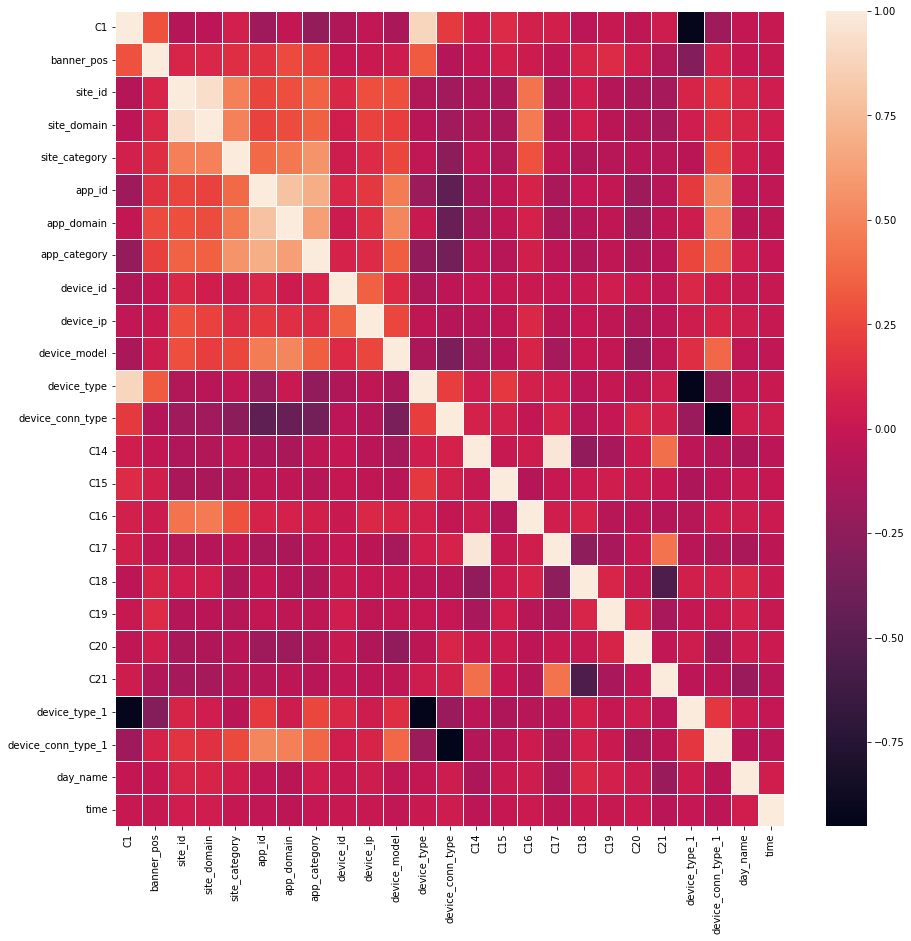

In [44]:

fig, ax = plt.subplots (figsize = (15,15))
sns.heatmap(X.corr(), linewidth = 1)

Observations:
1. C14 and C17 are highly correlated 
2. Site_domain and device_type 1 are negatively correlated.
2. C1 and device_mobile are perfectly correlated. 
3. C21 and C18 are also negatively correlated
    

Decisions:
1. Drop C14
2. Drop site_domain
 
3. Drop C1
4. Drop C21


In [45]:
# df_2.columns

##### Drop above mentioned columns

In [46]:
Columns_1 = ['C1', 'C14', 'C21', 'site_domain', 'device_ip']
X.drop(columns= Columns_1, inplace = True)

X.head()

,banner_pos,site_id,site_category,app_id,app_domain,app_category,device_id,device_model,device_type,device_conn_type,C15,C16,C17,C18,C19,C20,device_type_1,device_conn_type_1,day_name,time
0,0,0.130912,0.284635,0.199321,0.195680,0.199907,0.172841,0.225173,1,0,320,50,2333,0,39,-1,0.168338,0.180856,0.163963,0
1,0,0.200149,0.200066,0.199321,0.195680,0.199907,0.172841,0.139043,1,0,320,50,1722,0,35,100084,0.168338,0.180856,0.163963,0
2,1,0.116874,0.127153,0.173317,0.195680,0.104854,0.147307,0.145319,4,0,320,50,2493,3,35,-1,0.097087,0.180856,0.163963,0
3,0,0.043572,0.284635,0.199321,0.195680,0.199907,0.172841,0.168317,1,2,320,50,2333,0,39,100103,0.168338,0.134657,0.163963,0
4,0,0.116874,0.127153,0.202441,0.202441,0.243382,0.172841,0.205192,1,0,320,50,2161,0,35,-1,0.168338,0.180856,0.163963,0


##### Scaling numerical Features

Scaling to transform features to get their mean and standard deviation of 0 and 1. 

In [47]:
X_new, y_new = X,y

In [48]:
# len(X_new)

In [49]:
# len(y_new)

#### Scale

In [50]:
scaler = MinMaxScaler()

In [53]:
X_new[X_new.columns] = scaler.fit_transform(X_new[X_new.columns])

In [54]:
len(X_new)

50000

### Model Development, Training and Evaluations

In [55]:
#Training and Testsets
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size = 0.10, shuffle = True, random_state = 42)

#### Naive Bayes Model

In [56]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB()

In [57]:
y_train_predict = gnb.predict(X_train)
#train_accuracy = accuracy_score(y_train, y_train_predict)
print ('Accuracy on training data based on GNB is %.2f' % (accuracy_score(y_train, y_train_predict)))

Accuracy on training data based on GNB is 0.76


In [58]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [59]:
pred_gnb= gnb.predict(X_test)


In [60]:


colnames = ['P_Not_Click', "P_Click"]
pd.DataFrame(confusion_matrix(y_test, pred_gnb), columns = colnames)

,P_Not_Click,P_Click
0,3334,807
1,408,451


In [61]:
matrix = classification_report(y_test, pred_gnb)
print ('Classification report : \n', matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.89      0.81      0.85      4141
           1       0.36      0.53      0.43       859

    accuracy                           0.76      5000
   macro avg       0.62      0.67      0.64      5000
weighted avg       0.80      0.76      0.77      5000



In [ ]:
# prec_NB = precision_score(y_test, pred_gnb, average = 'weighted')
# recall_NB = recall_score(y_test, pred_gnb, average ="weighted")
# fbeta_NB = f1_score(y_test, pred_gnb, average = "weighted")

In [ ]:
# print("Precision: %s, Recall: %s, F-beta score: %s" %(prec_NB, recall_NB, fbeta_NB))

#### XG Boost Model

In [62]:
import xgboost as xgb

##### Instantiate XG Boost Classifier

In [63]:
xgb_clf = xgb.XGBClassifier(randomstate = 42)

##### examinimg the parameters

In [64]:
xgb_clf.get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': None,
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None,
 'randomstate': 42}

##### Hyper Parameters tuning with Random Search

In [65]:
from sklearn.model_selection import RandomizedSearchCV

##### Define a parameter

In [66]:
rs_param_grid ={
    "max_depth": list((range(3,10))),
    "alpha" : [0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80],
    
    "subsample":np.linspace(0.6, 1, 100),
    "learning_rate":np.linspace(0.10, 1, 100),
    "n_estimators" : list((range(10,100))),
    "gamma": np.linspace(0.5, 3, 10)

}


##### Instantiate XG Boost Classifier

In [67]:
xgb_clf= xgb.XGBClassifier(eval_metric = 'error', random_state = 42)

##### Instantiate RandomSearchCV

In [68]:
xgb_rs = RandomizedSearchCV(estimator = xgb_clf,
                       param_distributions = rs_param_grid, cv  = 10, 
                       n_iter = 10,
                       verbose = 2,
                       random_state = 42)

In [69]:
xgb_rs.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV] END alpha=0.5, gamma=0.7777777777777778, learning_rate=0.7636363636363636, max_depth=3, n_estimators=25, subsample=0.9838383838383837; total time=   0.1s
[CV] END alpha=0.5, gamma=0.7777777777777778, learning_rate=0.7636363636363636, max_depth=3, n_estimators=25, subsample=0.9838383838383837; total time=   0.0s
[CV] END alpha=0.5, gamma=0.7777777777777778, learning_rate=0.7636363636363636, max_depth=3, n_estimators=25, subsample=0.9838383838383837; total time=   0.0s
[CV] END alpha=0.5, gamma=0.7777777777777778, learning_rate=0.7636363636363636, max_depth=3, n_estimators=25, subsample=0.9838383838383837; total time=   0.0s
[CV] END alpha=0.5, gamma=0.7777777777777778, learning_rate=0.7636363636363636, max_depth=3, n_estimators=25, subsample=0.9838383838383837; total time=   0.0s
[CV] END alpha=0.5, gamma=0.7777777777777778, learning_rate=0.7636363636363636, max_depth=3, n_estimators=25, subsample=0.9838383838383837; to

[CV] END alpha=0.8, gamma=2.166666666666667, learning_rate=0.1181818181818182, max_depth=7, n_estimators=72, subsample=0.907070707070707; total time=   0.7s
[CV] END alpha=0.8, gamma=2.166666666666667, learning_rate=0.1181818181818182, max_depth=7, n_estimators=72, subsample=0.907070707070707; total time=   0.7s
[CV] END alpha=0.8, gamma=2.166666666666667, learning_rate=0.1181818181818182, max_depth=7, n_estimators=72, subsample=0.907070707070707; total time=   0.7s
[CV] END alpha=0.8, gamma=2.166666666666667, learning_rate=0.1181818181818182, max_depth=7, n_estimators=72, subsample=0.907070707070707; total time=   0.7s
[CV] END alpha=0.8, gamma=2.166666666666667, learning_rate=0.1181818181818182, max_depth=7, n_estimators=72, subsample=0.907070707070707; total time=   0.8s
[CV] END alpha=0.8, gamma=2.166666666666667, learning_rate=0.1181818181818182, max_depth=7, n_estimators=72, subsample=0.907070707070707; total time=   0.7s
[CV] END alpha=0.8, gamma=2.166666666666667, learning_rate

RandomizedSearchCV(cv=10,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='error',
                                           feature_types=None, gamma=None,
                                           gpu_id=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_...
       0.86262626, 0.86666667, 0.87070707, 0.87474747, 0.87878788,
       0.88282828, 0.8868686

##### Best Parameters

In [70]:
print ("the best parameters are:", xgb_rs.best_params_)

the best parameters are: {'subsample': 0.907070707070707, 'n_estimators': 72, 'max_depth': 7, 'learning_rate': 0.1181818181818182, 'gamma': 2.166666666666667, 'alpha': 0.8}


In [71]:
xgb_clf = xgb.XGBClassifier(eval_metric = 'error', random_state = 72, subsample=0.907,
                            n_estimators=25,max_depth=7, learning_rate=0.1181, gamma=2.16,
                            alpha=0.8)

In [72]:
xgb_clf.fit(X_train, y_train)

XGBClassifier(alpha=0.8, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='error', feature_types=None,
              gamma=2.16, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1181, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=25, n_jobs=None, num_parallel_tree=None,
              predictor=None, ...)

In [73]:
xgb_rs.best_score_

0.8622222222222222

In [74]:
preds = xgb_clf.predict(X_test)
print ('Accuracy on test data based on XGBoost is %.2f' % (accuracy_score(y_test, preds)))

Accuracy on test data based on XGBoost is 0.86


In [75]:
collnames = ['P_Not-Click', "P_Click"]
pd.DataFrame(confusion_matrix(y_test, preds), columns = colnames)

,P_Not_Click,P_Click
0,4114,27
1,673,186


In [76]:
matrix = classification_report(y_test, preds)
print ('Classification report : \n', matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.86      0.99      0.92      4141
           1       0.87      0.22      0.35       859

    accuracy                           0.86      5000
   macro avg       0.87      0.61      0.63      5000
weighted avg       0.86      0.86      0.82      5000



In [ ]:
# prec_xgb = precision_score(y_test, preds, average = 'weighted')
# recall_xgb = recall_score(y_test, preds, average ="weighted")
# fbeta_xgb = f1_score(y_test, preds, average = "weighted")

In [ ]:
# print("Precision: %s, Recall: %s, F-beta score: %s" %(prec_NB, recall_NB, fbeta_NB))

#### Logistic regression

In [77]:
from sklearn.linear_model import LogisticRegression



In [78]:
logik = LogisticRegression()

In [79]:
logik.fit(X_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [80]:
y_prob = logik.predict_proba(X_test)[:,1]
y_prob

array([0.20630316, 0.03975443, 0.0599995 , ..., 0.76430307, 0.21287737,
       0.1310557 ])

In [ ]:
# fpr,tpr,_= roc_curve(y_test, y_prob)

In [81]:
preds_logik = logik.predict(X_test)

In [82]:
collnames = ['P_Not-Click', "P_Click"]
pd.DataFrame(confusion_matrix(y_test, preds_logik), columns = colnames)

,P_Not_Click,P_Click
0,4091,50
1,673,186


In [83]:
matrix = classification_report(y_test, preds_logik)
print ('Classification report : \n', matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.86      0.99      0.92      4141
           1       0.79      0.22      0.34       859

    accuracy                           0.86      5000
   macro avg       0.82      0.60      0.63      5000
weighted avg       0.85      0.86      0.82      5000



#### Implementation of Random Forest 

In [84]:
from sklearn.ensemble import RandomForestClassifier

In [85]:
model_rf = RandomForestClassifier(random_state = 42)
model_rf.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [86]:
preds_rf = model_rf.predict(X_test)

In [87]:
colnames = ['P_Not-Click', "P_Click"]
pd.DataFrame(confusion_matrix(y_test, preds_rf), columns = colnames)

,P_Not-Click,P_Click
0,3916,225
1,580,279


In [88]:
matrix = classification_report(y_test, preds_rf)
print ('Classification report : \n', matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.87      0.95      0.91      4141
           1       0.55      0.32      0.41       859

    accuracy                           0.84      5000
   macro avg       0.71      0.64      0.66      5000
weighted avg       0.82      0.84      0.82      5000



#### Implementation of Gradient Boost

In [89]:
from sklearn.ensemble import GradientBoostingClassifier

##### Define a parameter

In [90]:
rs_param_grid ={
    "max_depth": list((range(3,10))),
    "min_samples_split" : list((range(3, 10))),
    "min_samples_leaf": list((range(1, 32))),
    
    "subsample":np.linspace(0.6, 1, 100),
    "learning_rate":np.linspace(0.10, 1, 100),
    "n_estimators" : list((range(10,100)))
    

}


In [91]:
gb_clf= GradientBoostingClassifier( random_state = 42)

##### Instantiate RandomizedSearchCV

In [92]:
gb_rs = RandomizedSearchCV(estimator = gb_clf,
                       param_distributions = rs_param_grid, cv  = 10, 
                       n_iter = 10,
                       verbose = 2,
                       random_state = 42)

In [93]:
gb_rs.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV] END learning_rate=0.9454545454545454, max_depth=4, min_samples_leaf=5, min_samples_split=6, n_estimators=84, subsample=0.6767676767676767; total time=   2.5s
[CV] END learning_rate=0.9454545454545454, max_depth=4, min_samples_leaf=5, min_samples_split=6, n_estimators=84, subsample=0.6767676767676767; total time=   2.5s
[CV] END learning_rate=0.9454545454545454, max_depth=4, min_samples_leaf=5, min_samples_split=6, n_estimators=84, subsample=0.6767676767676767; total time=   2.4s
[CV] END learning_rate=0.9454545454545454, max_depth=4, min_samples_leaf=5, min_samples_split=6, n_estimators=84, subsample=0.6767676767676767; total time=   2.4s
[CV] END learning_rate=0.9454545454545454, max_depth=4, min_samples_leaf=5, min_samples_split=6, n_estimators=84, subsample=0.6767676767676767; total time=   2.4s
[CV] END learning_rate=0.9454545454545454, max_depth=4, min_samples_leaf=5, min_samples_split=6, n_estimators=84, subsampl

[CV] END learning_rate=0.3727272727272727, max_depth=5, min_samples_leaf=31, min_samples_split=7, n_estimators=72, subsample=0.907070707070707; total time=   3.1s
[CV] END learning_rate=0.3727272727272727, max_depth=5, min_samples_leaf=31, min_samples_split=7, n_estimators=72, subsample=0.907070707070707; total time=   3.1s
[CV] END learning_rate=0.3727272727272727, max_depth=5, min_samples_leaf=31, min_samples_split=7, n_estimators=72, subsample=0.907070707070707; total time=   3.1s
[CV] END learning_rate=0.3727272727272727, max_depth=5, min_samples_leaf=31, min_samples_split=7, n_estimators=72, subsample=0.907070707070707; total time=   3.1s
[CV] END learning_rate=0.3727272727272727, max_depth=5, min_samples_leaf=31, min_samples_split=7, n_estimators=72, subsample=0.907070707070707; total time=   3.3s
[CV] END learning_rate=0.3727272727272727, max_depth=5, min_samples_leaf=31, min_samples_split=7, n_estimators=72, subsample=0.907070707070707; total time=   3.2s
[CV] END learning_rate

RandomizedSearchCV(cv=10, estimator=GradientBoostingClassifier(random_state=42),
                   param_distributions={'learning_rate': array([0.1       , 0.10909091, 0.11818182, 0.12727273, 0.13636364,
       0.14545455, 0.15454545, 0.16363636, 0.17272727, 0.18181818,
       0.19090909, 0.2       , 0.20909091, 0.21818182, 0.22727273,
       0.23636364, 0.24545455, 0.25454545, 0.26363636, 0.27272727,
       0.28181818, 0.29090909...
       0.86262626, 0.86666667, 0.87070707, 0.87474747, 0.87878788,
       0.88282828, 0.88686869, 0.89090909, 0.89494949, 0.8989899 ,
       0.9030303 , 0.90707071, 0.91111111, 0.91515152, 0.91919192,
       0.92323232, 0.92727273, 0.93131313, 0.93535354, 0.93939394,
       0.94343434, 0.94747475, 0.95151515, 0.95555556, 0.95959596,
       0.96363636, 0.96767677, 0.97171717, 0.97575758, 0.97979798,
       0.98383838, 0.98787879, 0.99191919, 0.9959596 , 1.        ])},
                   random_state=42, verbose=2)

#### Print Parameters

In [94]:
print ("the best parameters are:", gb_rs.best_params_)

the best parameters are: {'subsample': 0.6404040404040404, 'n_estimators': 62, 'min_samples_split': 8, 'min_samples_leaf': 23, 'max_depth': 4, 'learning_rate': 0.26363636363636367}


In [95]:
gb_clf =GradientBoostingClassifier(random_state = 42, subsample=0.64,
                            n_estimators=62,max_depth=4, learning_rate=0.2636, min_samples_split=8, min_samples_leaf = 23)

In [96]:
gb_clf.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.2636, max_depth=4,
                           min_samples_leaf=23, min_samples_split=8,
                           n_estimators=62, random_state=42, subsample=0.64)

In [97]:
gb_rs.best_score_

0.8623111111111111

In [98]:
pred_gb = gb_clf.predict(X_test)
print ('Accuracy on test data based on Gradient Boost is %.2f' % (accuracy_score(y_test, pred_gb)))

Accuracy on test data based on Gradient Boost is 0.86


In [99]:
colnames = ['P_Not-Click', "P_Click"]
pd.DataFrame(confusion_matrix(y_test, pred_gb), columns = colnames)

,P_Not-Click,P_Click
0,4088,53
1,655,204


In [100]:
matrix = classification_report(y_test, pred_gb)
print ('Classification report : \n', matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.86      0.99      0.92      4141
           1       0.79      0.24      0.37       859

    accuracy                           0.86      5000
   macro avg       0.83      0.61      0.64      5000
weighted avg       0.85      0.86      0.83      5000



In [101]:
gb_clf.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.2636,
 'loss': 'deviance',
 'max_depth': 4,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 23,
 'min_samples_split': 8,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 62,
 'n_iter_no_change': None,
 'random_state': 42,
 'subsample': 0.64,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

#### Plotting ROC Curve

In [102]:
from sklearn import metrics


C:\Users\deyoz\AppData\Local\Temp\ipykernel_31540\3262021916.py:51: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.



<Figure size 432x288 with 0 Axes>

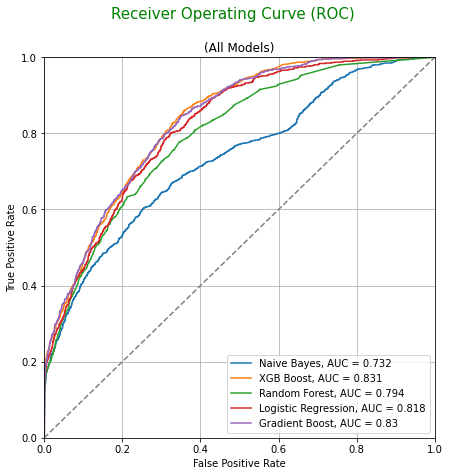

In [107]:
plt.figure(0).clf()
plt.figure(figsize = (7,7))

# Naive Bayes
y_pred = gnb.predict_proba(X_test)[:, 1]
fpr, tpr, _=metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 3)
plt.plot(fpr, tpr, label = "Naive Bayes, AUC = "+str(auc))


# XG Boost

y_pred = xgb_clf.predict_proba(X_test)[:, 1]
fpr, tpr, _=metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 3)
plt.plot(fpr, tpr, label = "XGB Boost, AUC = "+str(auc))


# Random Forest
y_pred = model_rf.predict_proba(X_test)[:, 1]
fpr, tpr, _=metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 3)
plt.plot(fpr, tpr, label = "Random Forest, AUC = "+str(auc))


# Logistic Regression
y_pred = logik.predict_proba(X_test)[:, 1]
fpr, tpr, _=metrics.roc_curve(y_test, y_pred)
auc= round(metrics.roc_auc_score(y_test, y_pred), 3)
plt.plot(fpr, tpr, label = 'Logistic Regression, AUC = '+str(auc))
         
    
    
# Gradient Boost
y_pred = gb_clf.predict_proba(X_test)[:, 1]
fpr, tpr, _=metrics.roc_curve(y_test, y_pred)
auc= round(metrics.roc_auc_score(y_test, y_pred), 3)
plt.plot(fpr, tpr, label = 'Gradient Boost, AUC = '+str(auc))

# plt.title("Receiver Operating Characteristics Curve", fontdict = {'family':'serif','color':'blue','size':20})
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.legend()
plt.ylabel('True Positive Rate')
plt.xlabel ('False Positive Rate')
plt.suptitle('Receiver Operating Curve (ROC)', fontsize = 15, color = "green")

plt.title(label = '(All Models)'
          , size = 12
          ,color = "black")
plt.plot([0, 1], [0, 1],'r--', color = 'grey')
plt.grid(True)
plt.show()


Observations:
    XG boost and Gradient Boost have better performance over other models. Though XG boost and gradient boost have similar results, we can safely discard Gradient boost as its poerformance is no better than XG boost and it consumes lot of resources. 

### Set threshhold for classification

In [109]:
from sklearn.metrics import precision_recall_curve

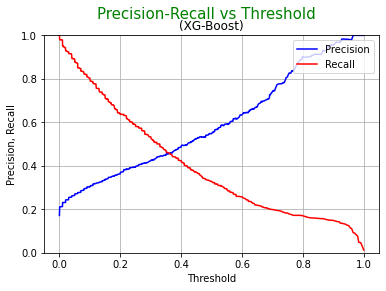

In [110]:
pred_y=xgb_clf.predict(X_test) 

probs_xgb=xgb_clf.predict_proba(X_test) 
  # probs_y is a 2-D array of probability of being labeled as 0 (first column of array) vs 1 (2nd column in array)


precision, recall, thresholds = precision_recall_curve(y_test, probs_y[:, 1]) 
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = metrics.auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b", label="Precision")
plt.plot(thresholds, recall[: -1], "r", label="Recall")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="upper right")
plt.suptitle('Precision-Recall vs Threshold',fontsize = 15, color = "green" )
plt.title("(XG-Boost)", size = 12, color = 'black')
plt.ylim([0,1])
plt.grid(True)

Observation:
    In about 25 percent threshold, the precision is 40 percent and recall is about 60 percent. Likewise, in 20 percent threshold, the precision is about 36 percent and recall is 75%. So, it looks taking threshold of anything between 15 and 25 percent will give good recall, with out loosing much precision.

In [115]:
threshold = 0.20


In [116]:
predicted_proba = xgb_clf.predict_proba(X_test)
predicted = (predicted_proba [:,1]>= threshold).astype('int')

In [117]:
colnames = ['P_Not-Click', "P_Click"]
pd.DataFrame(confusion_matrix(y_test, predicted), columns = colnames)

,P_Not-Click,P_Click
0,3039,1102
1,225,634


In [118]:
matrix = classification_report(y_test, predicted)
print ('Classification report : \n', matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.93      0.73      0.82      4141
           1       0.37      0.74      0.49       859

    accuracy                           0.73      5000
   macro avg       0.65      0.74      0.65      5000
weighted avg       0.83      0.73      0.76      5000



#### Cumulative gains Chart

In [120]:
import scikitplot as skplt

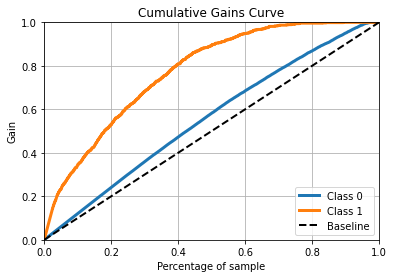

In [121]:
skplt.metrics.plot_cumulative_gain(y_test, probs_xgb)
plt.show()


Observation:
    We can see from the cumulative gains curve for the class of interest, which is labeled Class 1 that selecting the top 20 % of the leads ranked as most likely to respond to a marketing offer will contain  about 55% of the actual responders.The expected baseline number without using the model would only be 20%.

#### Lift Curve

<Figure size 504x504 with 0 Axes>

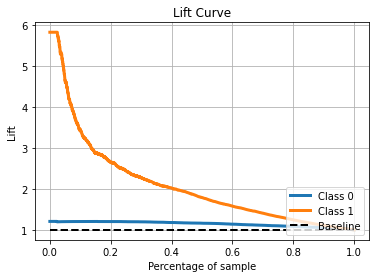

In [122]:
plt.figure(figsize=(7,7))
skplt.metrics.plot_lift_curve(y_test, probs_xgb)
plt.show()

Observation:
    the value on the y-axis for the lift curve for Class 1 at 20% appears to be roughly 2.7, indicating the models effectiveness over no model at all.

Text(0.5, 1.0, 'Feature importance by gain')

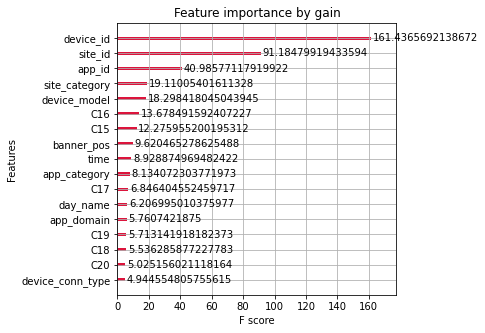

In [123]:

from matplotlib.ticker import FormatStrFormatter
matplotlib.rcParams['figure.figsize'] = (5,5)
xgb.plot_importance(xgb_clf, importance_type = "gain", color = 'crimson')
plt.title('Feature importance by gain')
